# Notebook Setup

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

data_dir = 'dataset/'

# Set plot styles for better visuals
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams['figure.figsize'] = (10, 6)

# 1. Data Overview and Structure

In [41]:
# Setting up description mechanism
description = pd.read_csv(os.path.join(data_dir, 'WiDS_Datathon_2020_Dictionary.csv'))
description_dict = description.set_index('Variable Name').to_dict(orient='index')

# Reading data
df = pd.read_csv(os.path.join(data_dir, 'training_v2.csv'))

### Instruction
- You can retrieve the description of a variable in the data set from the description dictionary as follows:

In [42]:
#description_dict['immunosuppression']
description_dict['icu_stay_type']
#description_dict['icu_type']
#description_dict['apache_3j_bodysystem']
#description_dict['apache_2_bodysystem']

{'Category': 'demographic',
 'Unit of Measure': nan,
 'Data Type': 'string',
 'Description': nan,
 'Example': nan}

In [43]:
# Print the shape and first few rows to get an idea of the data dimensions and content.
print("Number of samples\t:", df.shape[0])
print("Number of features\t:", df.shape[1])

Number of samples	: 91713
Number of features	: 186


## Analyze the distribution of missing values in the dataset

In [44]:
df_initial = df

# Calculates the percentage of missing values in each column
missing_percentages = df.isnull().mean() * 100

# Identifies columns with more than 20% missing values
high_missing_cols = missing_percentages[missing_percentages > 20].index.tolist()

# Remove columns with high percentage of missing values
df = df.drop(columns=high_missing_cols)

# Remove samples that have missing values in any of the columns
df = df.dropna()

# Print the result
print(f"Length of inefficient columns \t : {len(high_missing_cols)} / Before: {len(df_initial.columns)} After: {len(df.columns)}")
print(f"Total number of samples \t : {len(df)}")

print(f"Total number of samples after removing missing values: Now: {len(df)} Before: {len(df_initial)}")

print(f"Column names with more than {20}% missing values:")
print(high_missing_cols)
print("Missing percentage of data: {:.2f} %".format( (len(df)/len(df_initial))*100 ))

Length of inefficient columns 	 : 82 / Before: 186 After: 104
Total number of samples 	 : 45373
Total number of samples after removing missing values: Now: 45373 Before: 91713
Column names with more than 20% missing values:
['hospital_admit_source', 'albumin_apache', 'bilirubin_apache', 'bun_apache', 'creatinine_apache', 'fio2_apache', 'hematocrit_apache', 'paco2_apache', 'paco2_for_ph_apache', 'pao2_apache', 'ph_apache', 'sodium_apache', 'urineoutput_apache', 'wbc_apache', 'd1_diasbp_invasive_max', 'd1_diasbp_invasive_min', 'd1_mbp_invasive_max', 'd1_mbp_invasive_min', 'd1_sysbp_invasive_max', 'd1_sysbp_invasive_min', 'h1_diasbp_invasive_max', 'h1_diasbp_invasive_min', 'h1_mbp_invasive_max', 'h1_mbp_invasive_min', 'h1_sysbp_invasive_max', 'h1_sysbp_invasive_min', 'h1_temp_max', 'h1_temp_min', 'd1_albumin_max', 'd1_albumin_min', 'd1_bilirubin_max', 'd1_bilirubin_min', 'd1_inr_max', 'd1_inr_min', 'd1_lactate_max', 'd1_lactate_min', 'h1_albumin_max', 'h1_albumin_min', 'h1_bilirubin_max',

# 2. Visualizing the Target Variable

We clearly have an imbalanced dataset regarding the target output.

Would be well-welcomed to have understood what kind of missing data situation we are dealing with: missing at random, not at random or totally at random

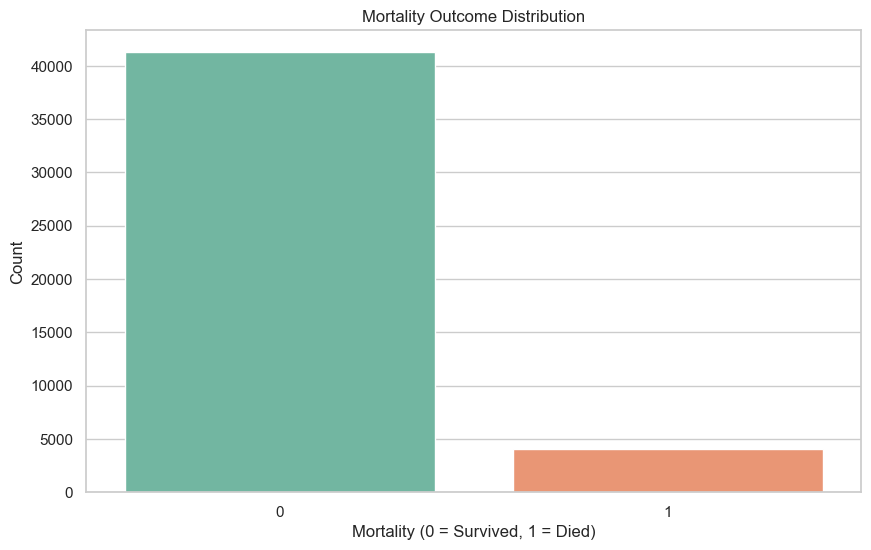

In [45]:
# Plot the distribution of the target variable
if 'hospital_death' in df.columns:
    plt.figure()
    ax = sns.countplot(x='hospital_death', data=df, palette="Set2", hue='hospital_death')
    ax.get_legend().remove()  # Remove legend to mimic previous behavior
    plt.title('Mortality Outcome Distribution')
    plt.xlabel('Mortality (0 = Survived, 1 = Died)')
    plt.ylabel('Count')
    plt.show()
else:
    print("Column 'mortality' not found in the dataset.")

In [46]:
# Calculating the death toll
number_of_deads = np.sum(df['hospital_death'] == 1)
number_of_survivors = np.sum(df['hospital_death'] == 0)
print("Dead: {} Survived: {} out of a total of {}".format(number_of_deads, number_of_survivors, len(df['hospital_death'])))

Dead: 4088 Survived: 41285 out of a total of 45373


# 3. Correlation Heatmap

There is no apparent correlation between the mortality outcome and any of the features

In [47]:
# Identify numerical columns for analysis
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Compute correlation matrix for numeric features
method = 'kendall' # 'pearson', 'kendall', 'spearman'
corr_matrix = df[numeric_cols].corr(method=method)

plt.figure(figsize=(200, 200))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, vmin=-1, vmax=1)
plt.title(f'Correlation Matrix of Numeric Features using {method.capitalize()} Method', fontsize=160)
plt.tick_params(axis='x', labelsize=90)
plt.tick_params(axis='y', labelsize=90)
plt.show()

Uncomment the code to visualize the histogram plots of ALL features. Takes about 30s to plot. Not easy to navigate

In [48]:
# Example: Visualize distribution of 'age' (if exists) by mortality outcome
# if 'age' in df.columns and 'hospital_death' in df.columns:
#     plt.figure()
#     sns.boxplot(x='hospital_death', y='age', data=df, palette="Set3")
#     plt.title('Age Distribution by Mortality Outcome')
#     plt.xlabel('Mortality (0 = Survived, 1 = Died)')
#     plt.ylabel('Age')
#     plt.show()

# Loop through other numeric columns to check for potential nonlinear relationships or outliers.
# for col in numeric_cols:
#     if col != 'hospital_death':
#         plt.figure()
#         sns.boxplot(x='hospital_death', y=col, data=df, palette="Set1")
#         plt.title(f'{col} Distribution by Mortality Outcome')
#         plt.xlabel('Mortality (0 = Survived, 1 = Died)')
#         plt.ylabel(col)
#         plt.show()

# 4. Visualization of Categorical Features

There is an imbalance in:
- ethnicity
- mortality outcome
- admit type
- Bodysystem

C:\Users\klaem\AppData\Local\Temp\ipykernel_1284\2359289262.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


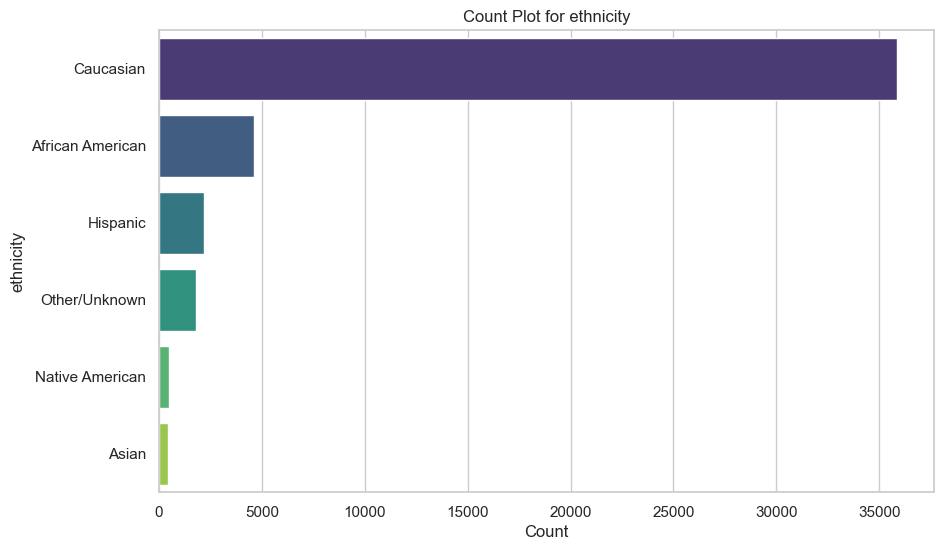

C:\Users\klaem\AppData\Local\Temp\ipykernel_1284\2359289262.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


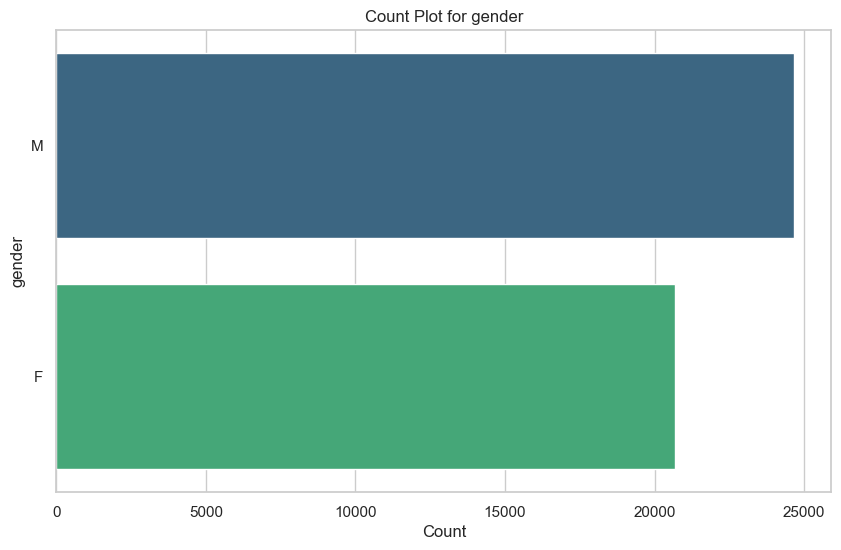

C:\Users\klaem\AppData\Local\Temp\ipykernel_1284\2359289262.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


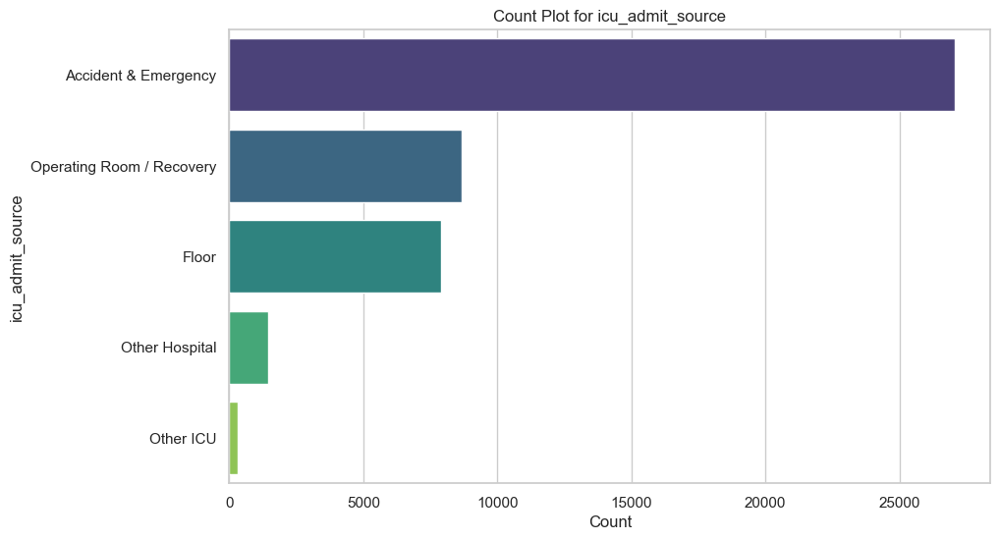

C:\Users\klaem\AppData\Local\Temp\ipykernel_1284\2359289262.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


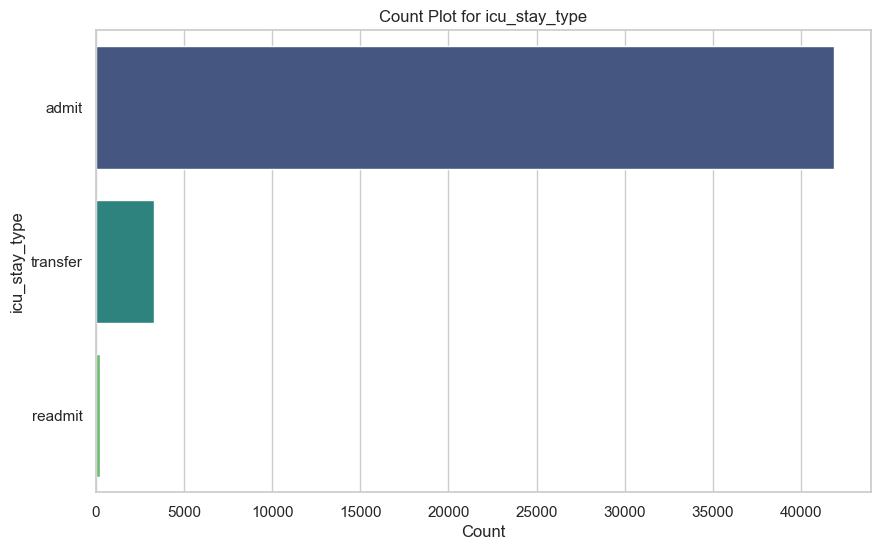

C:\Users\klaem\AppData\Local\Temp\ipykernel_1284\2359289262.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


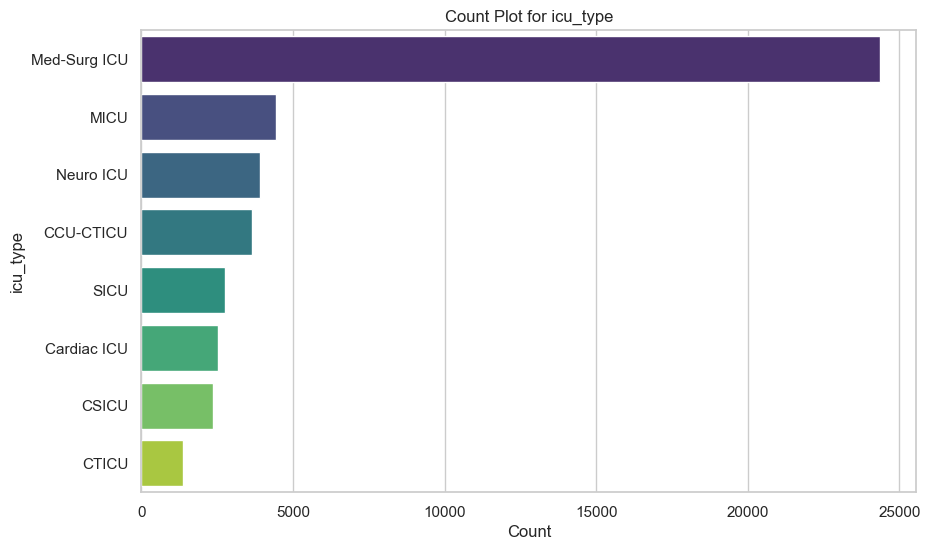

C:\Users\klaem\AppData\Local\Temp\ipykernel_1284\2359289262.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


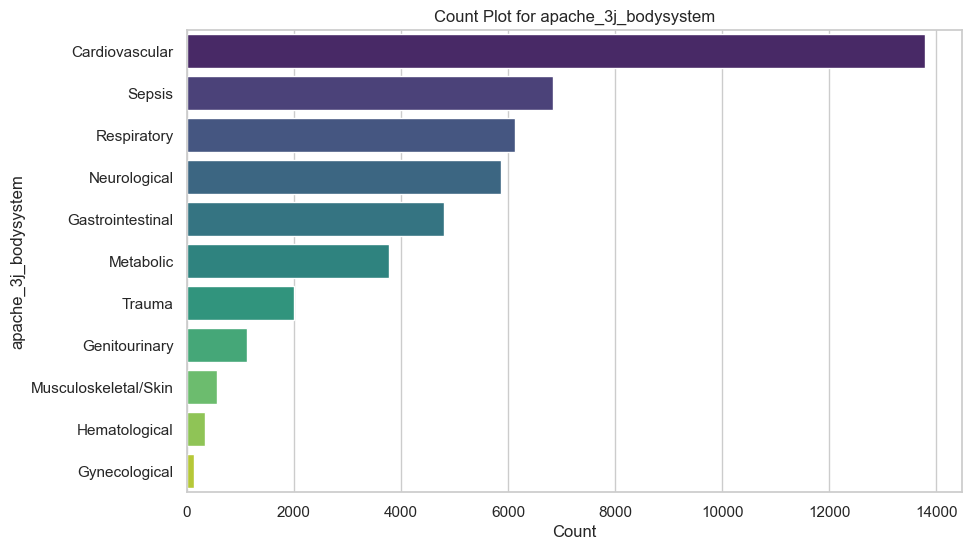

C:\Users\klaem\AppData\Local\Temp\ipykernel_1284\2359289262.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


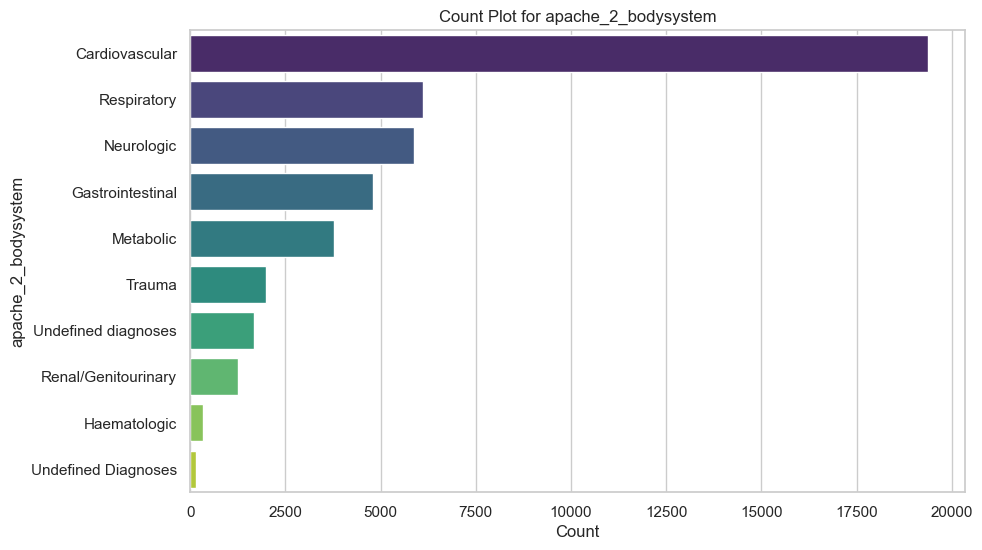

In [49]:
# Get the list of categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
for col in categorical_cols:
    plt.figure()
    sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)
    plt.title(f'Count Plot for {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

# 5. Additional Visualizations

### Visualize the Performance of the Current APACHE IV Mortality Prediction Method

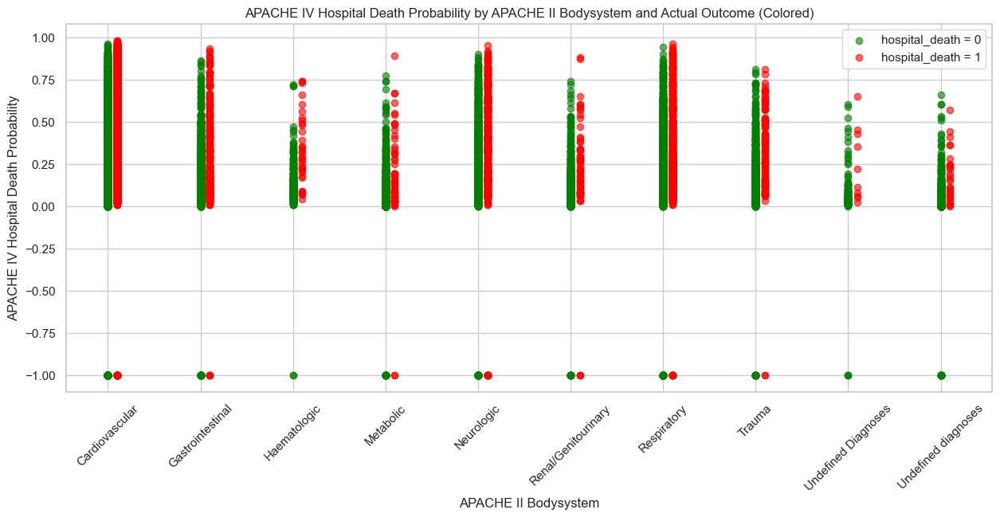

In [50]:
# Map each categorical value in 'apache_2_bodysystem' to a numeric code.
df["x_numeric"] = df["apache_2_bodysystem"].astype("category").cat.codes
categories = df["apache_2_bodysystem"].astype("category").cat.categories

# Create separate dataframes for red and green samples.
df_red = df[df["hospital_death"] == 1].copy()
df_green = df[df["hospital_death"] == 0].copy()

# Shift red samples to the right by adding a small offset.
df_red.loc[:, "x_numeric"] = df_red["x_numeric"] + 0.1

plt.figure(figsize=(15, 6))
plt.scatter(
    df_green["x_numeric"],
    df_green["apache_4a_hospital_death_prob"],
    color="green",
    label="hospital_death = 0",
    alpha=0.6
)
plt.scatter(
    df_red["x_numeric"],
    df_red["apache_4a_hospital_death_prob"],
    color="red",
    label="hospital_death = 1",
    alpha=0.6
)

# Set xticks to show the original category labels.
plt.xticks(ticks=np.arange(len(categories)), labels=categories, rotation=45)
plt.title("APACHE IV Hospital Death Probability by APACHE II Bodysystem and Actual Outcome (Colored)")
plt.xlabel("APACHE II Bodysystem")
plt.ylabel("APACHE IV Hospital Death Probability")
plt.legend()
plt.show()

### Using Histogram

Here we can see that the current method focuses on reducing the False Negatives given that the Mortality is the Positive prediction. In the healthcare domain it should be this way, i.e., we should be cautious as well on this regard.

But I'm having a hard time interpreting the red bars. They seem to have a lot of low probability predictions that turned out to be a mortality.

Chris' reply: 
To me discussing once again the plot above would be a breath of fresh air. 
Pertaining to the histograms below, I could tell that the general tendency data manifests—namely, centering around a 0 mean—is a kind of occurrence whose root cause goes back to the imbalance between true negatives and true positives (i.e. Dead:4088 Survived:41285). Having understood—as a zero question—the underlying cause might help.

In [51]:
# Extract categories and mortality subsets
categories = df["apache_2_bodysystem"].astype("category").cat.categories
df_green = df[df["hospital_death"] == 0].copy()
df_red = df[df["hospital_death"] == 1].copy()

num_categories = len(categories)

# Create a figure with 2 rows and columns for each apache_2_bodysystem category
fig, axs = plt.subplots(2, num_categories, figsize=(20 * num_categories, 55), squeeze=False)

for i, cat in enumerate(categories):
    # Subset for hospital_death = 0 (green)
    subset_green = df_green[df_green["apache_2_bodysystem"] == cat]
    axs[0, i].hist(
        subset_green["apache_4a_hospital_death_prob"],
        bins=20,
        color="green",
        alpha=0.6,
        edgecolor="black"
    )
    axs[0, i].set_title(f"{cat}\n(Samples: {len(subset_green)})", fontsize=80)
    axs[0, i].set_xlabel("Death Prob", fontsize=60)
    axs[0, i].set_ylabel("Count")
    axs[0, i].tick_params(axis='y', labelsize=60)
    axs[0, i].tick_params(axis='x', labelsize=60)
    
    # Subset for hospital_death = 1 (red)
    subset_red = df_red[df_red["apache_2_bodysystem"] == cat]
    axs[1, i].hist(
        subset_red["apache_4a_hospital_death_prob"],
        bins=20,
        color="red",
        alpha=0.6,
        edgecolor="black"
    )
    axs[1, i].set_title(f"{cat}\n(Samples: {len(subset_red)})", fontsize=80)
    axs[1, i].set_xlabel("Death Prob", fontsize=60)
    axs[1, i].set_ylabel("Count")
    axs[1, i].tick_params(axis='y', labelsize=60)
    axs[1, i].tick_params(axis='x', labelsize=60)

fig.suptitle("Histogram of Apache 4a Death Prob by Bodysystem and Actual Death", fontsize=100)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

APACHE IV probability predictions vs Ethnicity by Mortality Outcome

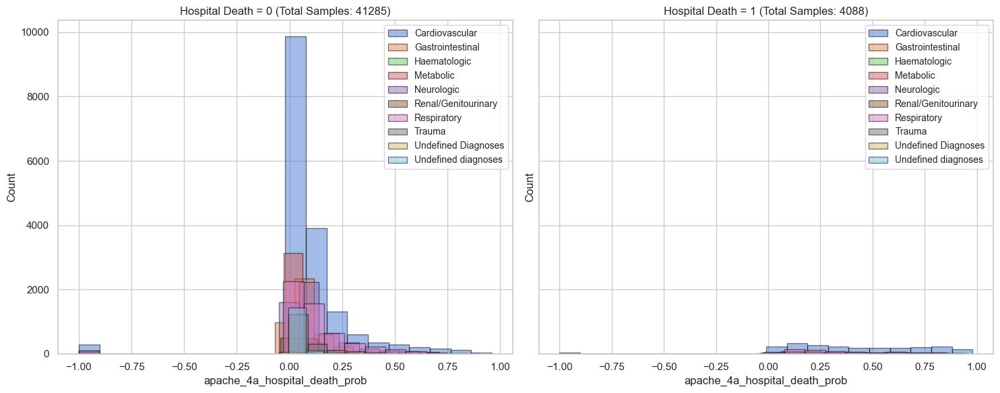

In [52]:
import matplotlib.pyplot as plt

# Convert categorical x-axis values to numeric codes
df["x_numeric"] = df["apache_2_bodysystem"].astype("category").cat.codes
categories = df["apache_2_bodysystem"].astype("category").cat.categories

# Filter the dataframe for each hospital_death value
df_green = df[df["hospital_death"] == 0].copy()
df_red = df[df["hospital_death"] == 1].copy()

# Create the figure and axis
fig2, axs2 = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# Helper function to plot histograms for a given group and axis
def plot_histograms(ax, df_group, group_title):
    for cat in categories:
        # Filter the group for the current apache_2_bodysystem category
        subset = df_group[df_group["apache_2_bodysystem"] == cat]
        # Plot the histogram
        ax.hist(
            subset["apache_4a_hospital_death_prob"],
            bins=20,
            alpha=0.5,
            label=str(cat),  # convert the category label to a string
            edgecolor="black"
        )

    ax.set_title(f"{group_title} (Total Samples: {len(df_group)})")
    ax.set_xlabel("apache_4a_hospital_death_prob")
    ax.set_ylabel("Count")
    ax.legend(fontsize='small', loc='best')

plot_histograms(axs2[0], df_green, "Hospital Death = 0")
plot_histograms(axs2[1], df_red, "Hospital Death = 1")

plt.tight_layout()
plt.show()

I honestly don't know how to interpret this but thought that might be useful.

Another remark is that I've also plotted the box plots for each feature separating by mortality outcome and there was no clear indication of mortality. The most informative was age but even that had overlapping box plots.

Within those box plots, most of features had lots of outliers

Final thoughts are:
- We have lots of missing values and the choice of dealing with those (estimating, removing, etc.) will affect the bias present. So one idea is to compare the results of different methods of handling missing values. For example we can compare the model's results on two settings where in one we can discard the missing values and in the other we can try to estimate them.
- Chirs: Absolutely correct. Could not say for sure which method does the best job - i.e. interpolation of missing values or estimation of missing values based on neighbors' difference - but having drawn a comparison in terms of bias's variation would help us to further understand the linkage between bias and missing values.

- We can use a random forest and analyze its trees to understand the data. For example we can look at the features that the model relies on the most or investigate the decision thresholds to have some insights.
- Chris: Not only the random forest but also a logistic regression in combination with a lasso regularizer can tell - very promptly, in terms of 0 and 1 - which features do mostly influence the output

- We have an imbalanced dataset in several aspects. The choice of how we proceed with this is also important in terms of the project's scope (using fairness metrics etc.)
- Chris: To my best knowledge, an imbalance in terms of sensitive features (ethnicity) will result in two kinds of biases: representation and quality of service biases. To probe this theory, equal opportunity (measuring the true positives rates across different ethnicities) and equal odds (the imbalance in terms of false positives and false negatives across groups) metrics might serve as instrumental tools;

- Chris: Clearly, data is preponderantly constituted from non-correlated features. However, across the center you will observe a kind of rectangle which comes about as a result of boxes conglomerated made up by positively-correlated features. Maybe zeroing in on the central part of the heat map might help us collect more insights.


# 6. Missing Data Pipeline and Random Forest Model

In this section, we'll create a pipeline to handle missing data and build a Random Forest model to predict hospital mortality. We'll compare different strategies for handling missing values and evaluate their impact on model performance.


In [53]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, precision_recall_curve
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np


## 6.1 Preparing Data - Using Original Dataset with Missing Values

Instead of removing columns with high missing values, let's load the original dataset again and use imputation techniques.


In [54]:
# Reload the original dataset
df_original = pd.read_csv(os.path.join(data_dir, 'training_v2.csv'))

# Split into features and target
X = df_original.drop(columns=['hospital_death'])
y = df_original['hospital_death']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Print dataset information
print(f"Training set size: {X_train.shape}")
print(f"Testing set size: {X_test.shape}")
print(f"Mortality rate in training set: {y_train.mean():.2%}")
print(f"Mortality rate in testing set: {y_test.mean():.2%}")


Training set size: (73370, 185)
Testing set size: (18343, 185)
Mortality rate in training set: 8.63%
Mortality rate in testing set: 8.63%


## 6.2 Analyzing Missing Values Distribution


Top 20 columns with highest missing value percentages:
h1_bilirubin_min        92.282949
h1_bilirubin_max        92.282949
h1_lactate_min          91.989914
h1_lactate_max          91.989914
h1_albumin_max          91.397029
h1_albumin_min          91.397029
h1_pao2fio2ratio_min    87.466267
h1_pao2fio2ratio_max    87.466267
h1_arterial_ph_max      83.419654
h1_arterial_ph_min      83.419654
h1_hco3_max             82.943983
h1_hco3_min             82.943983
h1_arterial_pco2_min    82.913998
h1_arterial_pco2_max    82.913998
h1_arterial_po2_min     82.903094
h1_arterial_po2_max     82.903094
h1_wbc_max              82.878561
h1_wbc_min              82.878561
h1_calcium_max          82.725910
h1_calcium_min          82.725910
dtype: float64


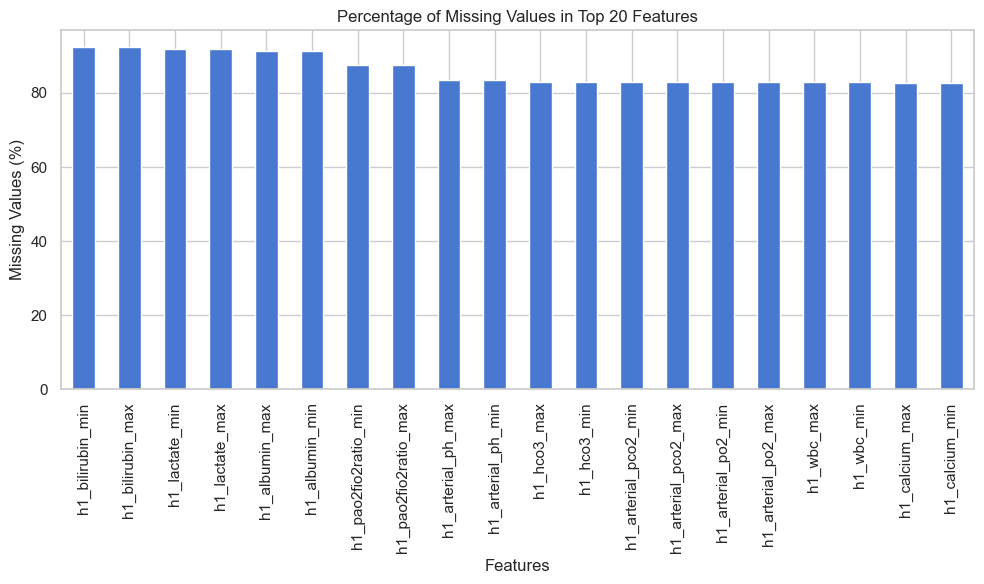

In [55]:
# Calculate percentage of missing values in each column
missing_percentages = X_train.isnull().mean().sort_values(ascending=False) * 100

# Display columns with highest missing value percentages
print("Top 20 columns with highest missing value percentages:")
print(missing_percentages.head(20))

# Visualize missing values
plt.figure(figsize=(10, 6))
missing_percentages.head(20).plot(kind='bar')
plt.title('Percentage of Missing Values in Top 20 Features')
plt.xlabel('Features')
plt.ylabel('Missing Values (%)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


## 6.3 Identify Numerical and Categorical Columns


In [56]:
# Get column types
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()

print(f"Number of numerical features: {len(numerical_cols)}")
print(f"Number of categorical features: {len(categorical_cols)}")

# Filter out columns with extremely high missing values (optional)
# For demonstration, we could filter out columns with >80% missing values
high_missing_cols = missing_percentages[missing_percentages > 80].index.tolist()
print(f"Number of columns with >80% missing values: {len(high_missing_cols)}")

# Remove columns with extremely high missing values
X_train = X_train.drop(columns=high_missing_cols)
X_test = X_test.drop(columns=high_missing_cols)

# Update our column lists after dropping high-missing columns
numerical_cols = [col for col in numerical_cols if col not in high_missing_cols]
categorical_cols = [col for col in categorical_cols if col not in high_missing_cols]


Number of numerical features: 177
Number of categorical features: 8
Number of columns with >80% missing values: 34


## 6.4 Create Different Imputation Pipelines

We'll compare different imputation strategies:
1. Simple Imputation (mean/mode)
2. KNN Imputation
3. Iterative Imputation (MICE)


In [57]:
# Function to create different preprocessing pipelines
def create_preprocessing_pipeline(imputation_strategy='simple'):
    """
    Create a preprocessing pipeline with different imputation strategies
    
    Parameters:
    -----------
    imputation_strategy : str
        'simple': Use SimpleImputer with mean for numerical, most frequent for categorical
        'knn': Use KNNImputer for numerical features
        'iterative': Use IterativeImputer (MICE) for numerical features
        
    Returns:
    --------
    preprocessor : ColumnTransformer
    """
    # Numerical preprocessing
    if imputation_strategy == 'simple':
        numerical_transformer = Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())
        ])
    elif imputation_strategy == 'knn':
        numerical_transformer = Pipeline(steps=[
            ('imputer', KNNImputer(n_neighbors=5)),
            ('scaler', StandardScaler())
        ])
    elif imputation_strategy == 'iterative':
        numerical_transformer = Pipeline(steps=[
            ('imputer', IterativeImputer(max_iter=10, random_state=42)),
            ('scaler', StandardScaler())
        ])
    
    # Categorical preprocessing is the same for all strategies
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])
    
    # Combine transformers in a column transformer
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, numerical_cols),
            ('cat', categorical_transformer, categorical_cols)
        ],
        remainder='drop'  # Drop columns not specified in the transformers
    )
    
    return preprocessor


## 6.5 Random Forest with Simple Imputation


Classification Report - Simple Imputation:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92     16760
           1       0.35      0.70      0.47      1583

    accuracy                           0.86     18343
   macro avg       0.66      0.79      0.70     18343
weighted avg       0.92      0.86      0.88     18343



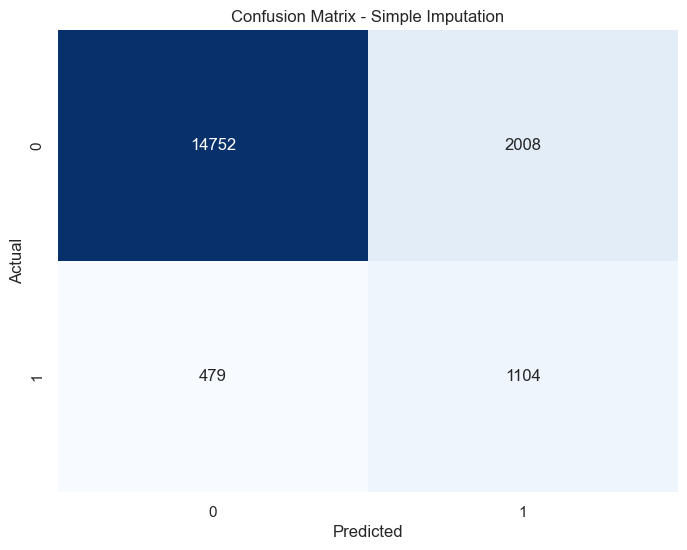

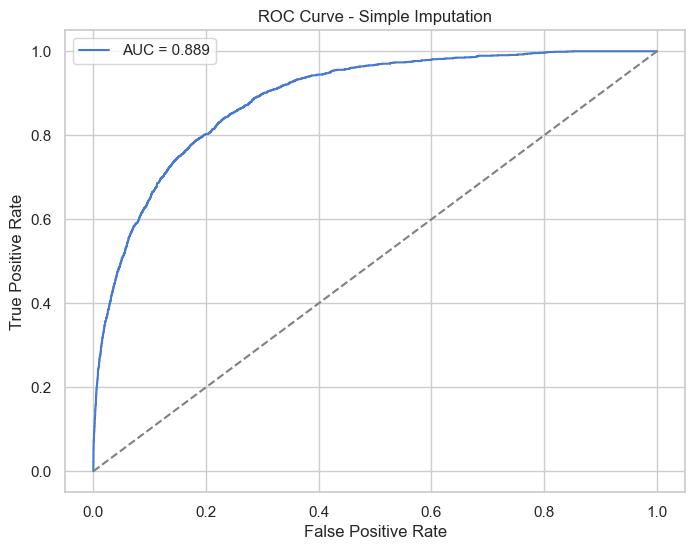

In [58]:
# Create and fit a pipeline with simple imputation
simple_preprocessor = create_preprocessing_pipeline('simple')

# Create a pipeline with preprocessing and random forest
pipe_rf_simple = Pipeline(steps=[
    ('preprocessor', simple_preprocessor),
    ('classifier', RandomForestClassifier(
        n_estimators=100, 
        max_depth=10,
        min_samples_split=10,
        random_state=42,
        class_weight='balanced',
        n_jobs=-1
    ))
])

# Fit the pipeline to the training data
pipe_rf_simple.fit(X_train, y_train)

# Evaluate on the test set
y_pred_simple = pipe_rf_simple.predict(X_test)
y_proba_simple = pipe_rf_simple.predict_proba(X_test)[:, 1]

# Print classification report
print("Classification Report - Simple Imputation:")
print(classification_report(y_test, y_pred_simple))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_simple)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Simple Imputation')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Plot ROC curve
plt.figure(figsize=(8, 6))
fpr, tpr, _ = roc_curve(y_test, y_proba_simple)
auc = roc_auc_score(y_test, y_proba_simple)
plt.plot(fpr, tpr, label=f'AUC = {auc:.3f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Simple Imputation')
plt.legend()
plt.show()


## 6.6 Compare Different Imputation Strategies


In [59]:
# Create and compare different imputation strategies
imputation_strategies = ['simple', 'knn', 'iterative']
pipelines = {}
scores = {}

for strategy in imputation_strategies:
    print(f"\nTraining model with {strategy} imputation...")
    
    # Create preprocessor for this strategy
    preprocessor = create_preprocessing_pipeline(strategy)
    
    # Create the pipeline
    pipelines[strategy] = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', RandomForestClassifier(
            n_estimators=100, 
            max_depth=10, 
            min_samples_split=10,
            random_state=42,
            class_weight='balanced',
            n_jobs=-1
        ))
    ])
    
    # Fit the pipeline
    pipelines[strategy].fit(X_train, y_train)
    
    # Evaluate on test set
    y_proba = pipelines[strategy].predict_proba(X_test)[:, 1]
    y_pred = pipelines[strategy].predict(X_test)
    
    # Store scores
    scores[strategy] = {
        'auc': roc_auc_score(y_test, y_proba),
        'accuracy': (y_pred == y_test).mean(),
        'report': classification_report(y_test, y_pred, output_dict=True)
    }
    
    print(f"AUC Score with {strategy} imputation: {scores[strategy]['auc']:.3f}")
    print(f"Accuracy with {strategy} imputation: {scores[strategy]['accuracy']:.3f}")
    print(f"Classification Report with {strategy} imputation:")
    print(classification_report(y_test, y_pred))

# Compare ROC curves
plt.figure(figsize=(10, 8))
for strategy in imputation_strategies:
    y_proba = pipelines[strategy].predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    auc = scores[strategy]['auc']
    plt.plot(fpr, tpr, label=f'{strategy.capitalize()} Imputation (AUC = {auc:.3f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves - Comparing Imputation Strategies')
plt.legend()
plt.show()



Training model with simple imputation...
AUC Score with simple imputation: 0.889
Accuracy with simple imputation: 0.864
Classification Report with simple imputation:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92     16760
           1       0.35      0.70      0.47      1583

    accuracy                           0.86     18343
   macro avg       0.66      0.79      0.70     18343
weighted avg       0.92      0.86      0.88     18343


Training model with knn imputation...
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\klaem\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py", line 3505, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\klaem\AppData\Local\Temp\ipykernel_1284\2250572402.py", line 26, in <module>
    pipelines[strategy].fit(X_train, y_train)
  File "C:\Users\klaem\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\klaem\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\pipeline.py", line 654, in fit
    Xt = self._fit(X, y, routed_params, raw_params=params)
  File "C:\Users\klaem\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\pipeline.py", line 588, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "C:\Users\klaem\AppData\Local\Programs\Python\Python310\lib\site-packages\joblib\memory.py", line 34

## 6.7 Handle Class Imbalance with SMOTE


In [ ]:
# Create a pipeline with SMOTE for handling class imbalance
# Using the best imputation strategy from the previous comparison
best_strategy = max(scores, key=lambda x: scores[x]['auc'])
print(f"Best imputation strategy: {best_strategy}")

# Create a pipeline with SMOTE
preprocessor = create_preprocessing_pipeline(best_strategy)
pipe_rf_smote = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('classifier', RandomForestClassifier(
        n_estimators=100, 
        max_depth=10,
        min_samples_split=10,
        random_state=42,
        n_jobs=-1
    ))
])

# Fit the pipeline
pipe_rf_smote.fit(X_train, y_train)

# Evaluate on test set
y_pred_smote = pipe_rf_smote.predict(X_test)
y_proba_smote = pipe_rf_smote.predict_proba(X_test)[:, 1]

# Print classification report
print("Classification Report - With SMOTE:")
print(classification_report(y_test, y_pred_smote))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_smote)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - With SMOTE')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Compare ROC curves with and without SMOTE
plt.figure(figsize=(10, 8))
# Plot ROC for best strategy without SMOTE
fpr, tpr, _ = roc_curve(y_test, pipelines[best_strategy].predict_proba(X_test)[:, 1])
auc = roc_auc_score(y_test, pipelines[best_strategy].predict_proba(X_test)[:, 1])
plt.plot(fpr, tpr, label=f'Without SMOTE (AUC = {auc:.3f})')

# Plot ROC for SMOTE
fpr, tpr, _ = roc_curve(y_test, y_proba_smote)
auc = roc_auc_score(y_test, y_proba_smote)
plt.plot(fpr, tpr, label=f'With SMOTE (AUC = {auc:.3f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves - With vs. Without SMOTE')
plt.legend()
plt.show()


## 6.8 Feature Importance Analysis

Let's analyze which features are most important in our random forest model.


In [ ]:
# Extract feature names from the pipeline
def get_feature_names(column_transformer):
    """Get feature names from all transformers."""
    output_features = []
    
    for name, pipe, features in column_transformer.transformers_:
        if name != 'remainder':
            if hasattr(pipe, 'get_feature_names_out'):
                if isinstance(features, slice):
                    features = list(column_transformer._feature_names_in[features])
                current_features = pipe.get_feature_names_out(features)
                output_features.extend(current_features.tolist())
            else:
                output_features.extend(features)
    
    return output_features

# Get feature names after transformation
preprocessor = pipelines[best_strategy].named_steps['preprocessor']
feature_names = get_feature_names(preprocessor)

# Get feature importances
feature_importances = pipelines[best_strategy].named_steps['classifier'].feature_importances_

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values('Importance', ascending=False)

# Plot top 20 most important features
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()


## 6.9 Hyperparameter Tuning

Now let's fine-tune our random forest model to get even better performance.


In [ ]:
# Define the parameter grid
param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [10, 20, None],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# Create a pipeline with the best imputation strategy
preprocessor = create_preprocessing_pipeline(best_strategy)
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42, class_weight='balanced', n_jobs=-1))
])

# Perform grid search with cross-validation
grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=3,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)

# Fit the grid search - This might take some time
print("Starting grid search. This might take some time...")
grid_search.fit(X_train, y_train)

# Print the best parameters
print("Best parameters:")
print(grid_search.best_params_)

# Evaluate with the best model
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test)
y_proba_best = best_model.predict_proba(X_test)[:, 1]

# Print classification report
print("Classification Report - Best Model:")
print(classification_report(y_test, y_pred_best))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_best)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Best Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Plot ROC curve
plt.figure(figsize=(8, 6))
fpr, tpr, _ = roc_curve(y_test, y_proba_best)
auc = roc_auc_score(y_test, y_proba_best)
plt.plot(fpr, tpr, label=f'AUC = {auc:.3f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Best Model')
plt.legend()
plt.show()


## 6.10 Compare with APACHE IV Prediction

The dataset contains the APACHE IV predicted probability of death. Let's compare our model with this existing prediction method.


In [ ]:
# Check if 'apache_4a_hospital_death_prob' is in the dataset
if 'apache_4a_hospital_death_prob' in X_test.columns:
    # Calculate ROC-AUC for APACHE IV predictions
    apache_proba = X_test['apache_4a_hospital_death_prob']
    apache_auc = roc_auc_score(y_test, apache_proba)
    
    # Plot ROC curves to compare
    plt.figure(figsize=(10, 8))
    
    # Plot for our best model
    fpr_best, tpr_best, _ = roc_curve(y_test, y_proba_best)
    plt.plot(fpr_best, tpr_best, label=f'Our Model (AUC = {auc:.3f})')
    
    # Plot for APACHE IV
    fpr_apache, tpr_apache, _ = roc_curve(y_test, apache_proba)
    plt.plot(fpr_apache, tpr_apache, label=f'APACHE IV (AUC = {apache_auc:.3f})')
    
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves - Our Model vs. APACHE IV')
    plt.legend()
    plt.show()
    
    # Compare precision-recall curves
    plt.figure(figsize=(10, 8))
    
    # Precision-recall curve for our model
    precision_best, recall_best, _ = precision_recall_curve(y_test, y_proba_best)
    plt.plot(recall_best, precision_best, label=f'Our Model')
    
    # Precision-recall curve for APACHE IV
    precision_apache, recall_apache, _ = precision_recall_curve(y_test, apache_proba)
    plt.plot(recall_apache, precision_apache, label=f'APACHE IV')
    
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curves - Our Model vs. APACHE IV')
    plt.legend()
    plt.show()
else:
    print("APACHE IV predictions not found in the dataset.")


## 6.11 Analysis by Demographic Groups

Let's analyze model performance across different demographic groups to check for potential biases.


In [ ]:
# Check if ethnicity information is available
if 'ethnicity' in X_test.columns:
    # Get ethnicity labels from test set
    ethnicities = X_test['ethnicity'].unique()
    
    # Create a figure to compare performance across ethnicities
    plt.figure(figsize=(12, 8))
    
    for ethnicity in ethnicities:
        # Get indices for this ethnic group
        ethnicity_indices = X_test['ethnicity'] == ethnicity
        
        # Skip if too few samples
        if sum(ethnicity_indices) < 10:
            continue
            
        # Get actual outcomes and predictions for this group
        y_true_group = y_test[ethnicity_indices]
        y_proba_group = y_proba_best[ethnicity_indices]
        
        # Calculate ROC curve
        fpr, tpr, _ = roc_curve(y_true_group, y_proba_group)
        auc = roc_auc_score(y_true_group, y_proba_group)
        
        # Plot ROC curve for this ethnicity
        plt.plot(fpr, tpr, label=f'{ethnicity} (AUC = {auc:.3f})')
    
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves by Ethnicity')
    plt.legend()
    plt.show()
    
    # Calculate and display fairness metrics
    print("\nFairness Metrics by Ethnicity:")
    metrics_by_ethnicity = {}
    
    for ethnicity in ethnicities:
        ethnicity_indices = X_test['ethnicity'] == ethnicity
        
        # Skip if too few samples
        if sum(ethnicity_indices) < 10:
            continue
            
        y_true_group = y_test[ethnicity_indices]
        y_pred_group = y_pred_best[ethnicity_indices]
        y_proba_group = y_proba_best[ethnicity_indices]
        
        # Calculate metrics
        metrics_by_ethnicity[ethnicity] = {
            'group_size': sum(ethnicity_indices),
            'mortality_rate': y_true_group.mean(),
            'auc': roc_auc_score(y_true_group, y_proba_group),
            'precision': classification_report(y_true_group, y_pred_group, output_dict=True)['1']['precision'],
            'recall': classification_report(y_true_group, y_pred_group, output_dict=True)['1']['recall'],
            'f1': classification_report(y_true_group, y_pred_group, output_dict=True)['1']['f1-score']
        }
    
    # Convert to DataFrame for better display
    metrics_df = pd.DataFrame(metrics_by_ethnicity).T
    metrics_df['group_size'] = metrics_df['group_size'].astype(int)
    metrics_df = metrics_df.sort_values('group_size', ascending=False)
    
    print(metrics_df)
else:
    print("Ethnicity information not available in the dataset.")


## 6.12 Analyze Feature Importance by Body System

Let's see how feature importance varies across different body systems.


In [ ]:
# Check if 'apache_2_bodysystem' is in the dataset
if 'apache_2_bodysystem' in X_test.columns:
    # Get unique body systems
    body_systems = X_test['apache_2_bodysystem'].unique()
    
    # For each body system, train a separate model and analyze feature importance
    for body_system in body_systems:
        # Filter data for this body system
        indices_train = X_train['apache_2_bodysystem'] == body_system
        indices_test = X_test['apache_2_bodysystem'] == body_system
        
        # Skip if too few samples
        if sum(indices_train) < 100 or sum(indices_test) < 20:
            continue
            
        print(f"\nAnalyzing body system: {body_system}")
        print(f"Training samples: {sum(indices_train)}, Test samples: {sum(indices_test)}")
        
        # Create and fit a model for this body system
        X_train_system = X_train[indices_train]
        y_train_system = y_train[indices_train]
        X_test_system = X_test[indices_test]
        y_test_system = y_test[indices_test]
        
        # Use the same pipeline as before
        preprocessor = create_preprocessing_pipeline(best_strategy)
        pipe_system = Pipeline([
            ('preprocessor', preprocessor),
            ('classifier', RandomForestClassifier(
                n_estimators=100,
                max_depth=10,
                random_state=42,
                class_weight='balanced'
            ))
        ])
        
        # Fit the model
        pipe_system.fit(X_train_system, y_train_system)
        
        # Evaluate
        y_pred_system = pipe_system.predict(X_test_system)
        y_proba_system = pipe_system.predict_proba(X_test_system)[:, 1]
        
        # Calculate AUC
        system_auc = roc_auc_score(y_test_system, y_proba_system)
        print(f"AUC for {body_system}: {system_auc:.3f}")
        
        # Get feature importances for this body system
        feature_importances = pipe_system.named_steps['classifier'].feature_importances_
        
        # Create a DataFrame for feature importances
        importance_df_system = pd.DataFrame({
            'Feature': feature_names[:len(feature_importances)],
            'Importance': feature_importances
        }).sort_values('Importance', ascending=False)
        
        # Print top 10 important features for this body system
        print(f"Top 10 features for {body_system}:")
        print(importance_df_system.head(10))
else:
    print("Body system information not available in the dataset.")


## 6.13 Conclusion and Next Steps

We've built a comprehensive pipeline for handling missing data and created a Random Forest model for predicting hospital mortality. Key findings include:

1. Different imputation strategies have varying effects on model performance
2. Class imbalance handling techniques like SMOTE can improve model performance
3. Feature importance analysis reveals the most critical predictors of mortality
4. Our model performance can be compared with the existing APACHE IV prediction
5. Fairness analysis across demographic groups helps identify potential biases

Next steps could include:
1. Trying other imputation techniques or ensemble approaches
2. Exploring different classification algorithms (XGBoost, Neural Networks)
3. Further hyperparameter tuning
4. Developing a more focused model for specific patient subgroups
5. Incorporating fairness constraints into the model training process